In [1]:
#import libraries
import numpy as np 
import pandas as pd 
import seaborn as sns
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from scipy.special import erfc
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold

In [2]:
#set working directory 
os.chdir("D:\DATA SCIENCE")

In [97]:
#load data
train=pd.read_csv("train.csv")
test=pd.read_csv("test.csv")

In [4]:
#shape of train and test data
train.shape, test.shape

((200000, 202), (200000, 201))

In [5]:
#checking types
train.dtypes

ID_code     object
target       int64
var_0      float64
var_1      float64
var_2      float64
var_3      float64
var_4      float64
var_5      float64
var_6      float64
var_7      float64
var_8      float64
var_9      float64
var_10     float64
var_11     float64
var_12     float64
var_13     float64
var_14     float64
var_15     float64
var_16     float64
var_17     float64
var_18     float64
var_19     float64
var_20     float64
var_21     float64
var_22     float64
var_23     float64
var_24     float64
var_25     float64
var_26     float64
var_27     float64
            ...   
var_170    float64
var_171    float64
var_172    float64
var_173    float64
var_174    float64
var_175    float64
var_176    float64
var_177    float64
var_178    float64
var_179    float64
var_180    float64
var_181    float64
var_182    float64
var_183    float64
var_184    float64
var_185    float64
var_186    float64
var_187    float64
var_188    float64
var_189    float64
var_190    float64
var_191    f

In [6]:
#observing data
train.head(5)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [7]:
#counting observations per target class
train.target.value_counts()

0    179902
1     20098
Name: target, dtype: int64

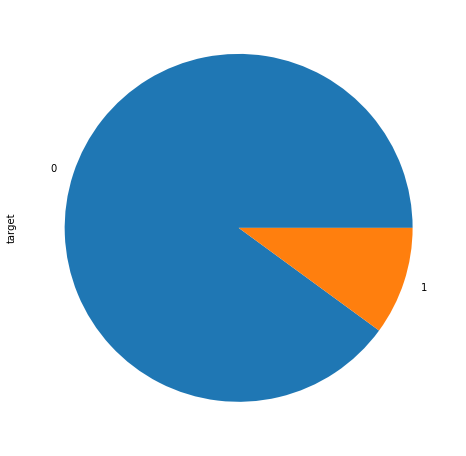

In [8]:
#plotting pie chart for target class
train['target'].value_counts().plot(kind='pie', figsize=(8,8))

##### Typical imbalanced target variable

In [9]:
#checking for missing values in train data
train.isna().sum().sum()

0

In [10]:
#checking for missing values in train data
test.isna().sum().sum()

0

#### No missing values!!!

In [11]:
#checking outliers using Chauvenet's criterion
def chauvenet(array):
    mean = array.mean()           # Mean of incoming array
    stdv = array.std()            # Standard deviation
    N = len(array)                # Lenght of incoming array
    criterion = 1.0/(2*N)         # Chauvenet's criterion
    d = abs(array-mean)/stdv      # Distance of a value to mean in stdv's
    prob = erfc(d)                # Area normal dist.    
    return prob < criterion       # Use boolean array outside this function

In [14]:
numerical_features=train.columns[2:]

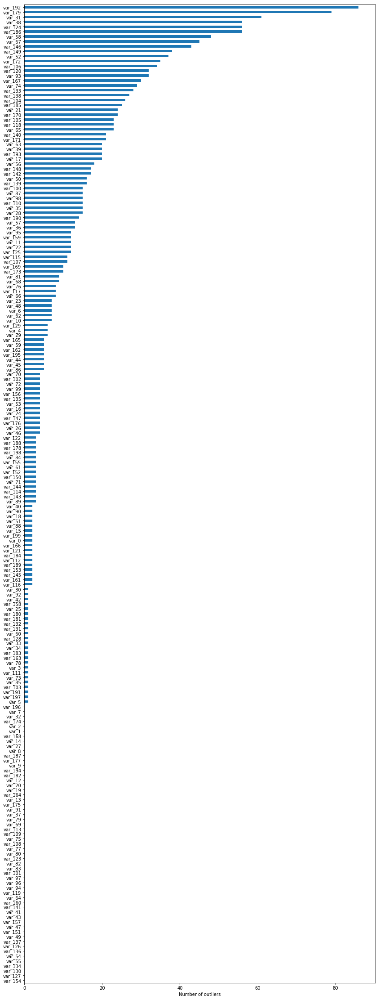

In [13]:
#outliers in each variable in train data 
train_outliers = dict()
for col in [col for col in numerical_features]:
    train_outliers[col] = train[chauvenet(train[col].values)].shape[0]
train_outliers = pd.Series(train_outliers)

train_outliers.sort_values().plot(figsize=(14, 40), kind='barh').set_xlabel('Number of outliers');

In [14]:
print('Total number of outliers in training set: {} ({:.2f}%)'.format(sum(train_outliers.values), (sum(train_outliers.values) / train.shape[0]) * 100))

Total number of outliers in training set: 1740 (0.87%)


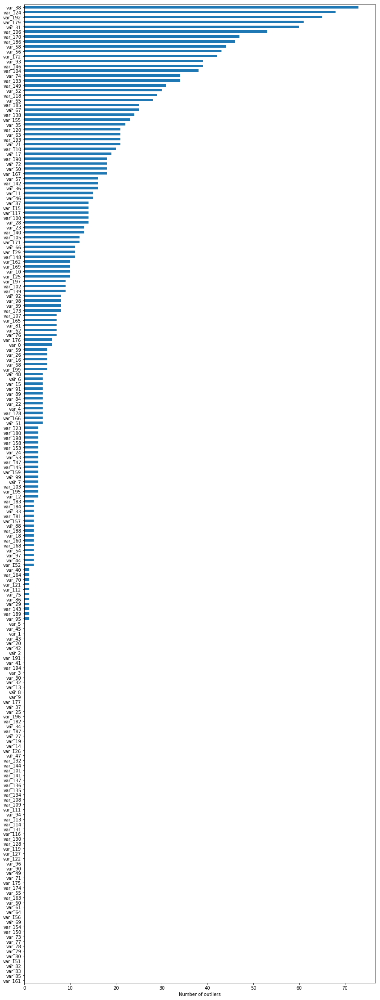

In [15]:
#outliers in each variable in test data 
test_outliers = dict()
for col in [col for col in numerical_features]:
    test_outliers[col] = test[chauvenet(test[col].values)].shape[0]
test_outliers = pd.Series(test_outliers)

test_outliers.sort_values().plot(figsize=(14, 40), kind='barh').set_xlabel('Number of outliers');

In [16]:
print('Total number of outliers in testing set: {} ({:.2f}%)'.format(sum(test_outliers.values), (sum(test_outliers.values) / test.shape[0]) * 100))

Total number of outliers in testing set: 1748 (0.87%)


In [115]:
#remove these outliers in train and test data
for col in numerical_features:
    train=train.loc[(~chauvenet(train[col].values))]
for col in numerical_features:
    test=test.loc[(~chauvenet(test[col].values))]    

In [116]:
#shape of train and test data after removal of outliers 
train.shape,test.shape

((198264, 202), (198250, 201))

In [19]:
#describe train data
train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000,198264.00000,198264.000000,198264.000000,...,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000,198264.000000
mean,0.100412,10.679648,-1.627397,10.714957,6.795908,11.078436,-5.064072,5.40897,16.546950,0.284490,...,3.234228,7.437792,1.927424,3.332112,17.995062,-0.141777,2.302057,8.908270,15.871506,-3.326076
std,0.300549,3.039746,4.049295,2.640958,2.043358,1.622350,7.863244,0.86632,3.418044,3.332136,...,4.558830,3.022433,1.474695,3.990749,3.134879,1.429218,5.454244,0.921744,3.010625,10.437785
min,0.000000,0.597900,-15.043400,2.117100,0.016200,5.831600,-30.681600,2.58750,5.349700,-10.505500,...,-11.909700,-2.343000,-2.985400,-9.946100,8.694400,-4.895500,-14.209600,5.960600,6.299300,-37.696200
25%,0.000000,8.454175,-4.738225,8.722175,5.252775,9.883900,-11.200925,4.76800,13.945775,-2.316500,...,-0.059450,5.157775,0.890100,0.584700,15.631575,-1.170700,-1.946925,8.252900,13.829875,-11.207900
50%,0.000000,10.524200,-1.607500,10.580300,6.824250,11.108500,-4.831600,5.38520,16.459450,0.394250,...,3.203100,7.347200,1.901700,3.396950,17.959500,-0.172400,2.407700,8.888400,15.935700,-2.822200
75%,0.000000,12.758200,1.357125,12.516800,8.323700,12.260300,0.925975,6.00280,19.103900,2.937550,...,6.405525,9.510725,2.949400,6.206200,20.397200,0.829500,6.555100,9.593700,18.065800,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.085500,17.251600,8.28520,27.691800,10.151300,...,18.342300,16.716500,6.839100,16.614600,27.928800,4.272900,18.321500,11.953400,25.857100,28.500700


In [20]:
#describe test data
test.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,...,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000,198250.000000
mean,10.658132,-1.623584,10.707341,6.788758,11.076134,-5.050805,5.414928,16.528881,0.276241,7.569020,...,3.191005,7.457581,1.924759,3.321467,17.998003,-0.133924,2.289797,8.912110,15.868352,-3.244830
std,3.036247,4.040598,2.633860,2.052983,1.616100,7.871060,0.864399,3.423769,3.333591,1.231789,...,4.548516,3.025499,1.477157,3.992591,3.140692,1.429526,5.446874,0.920674,3.008109,10.395702
min,0.922000,-15.043400,2.355200,-0.022400,5.803800,-27.767000,2.592100,5.713700,-9.956000,4.243300,...,-11.927200,-2.407000,-2.978600,-9.967000,9.382800,-4.874200,-13.944200,6.169600,6.584000,-36.325100
25%,8.441800,-4.699350,8.735600,5.230500,9.891000,-11.206400,4.772600,13.934700,-2.304100,6.623800,...,-0.091875,5.164900,0.882400,0.586700,15.636200,-1.160800,-1.950800,8.259900,13.845900,-11.121975
50%,10.514200,-1.589400,10.560800,6.823200,11.099400,-4.835950,5.391400,16.422000,0.370350,7.631300,...,3.163500,7.378300,1.892100,3.426950,17.978600,-0.162600,2.402950,8.892800,15.942700,-2.725950
75%,12.739600,1.343900,12.494975,8.328900,12.252900,0.942100,6.005400,19.093400,2.929700,8.584375,...,6.335500,9.530850,2.954700,6.172675,20.392200,0.838000,6.519500,9.595900,18.044800,4.935700
max,20.064900,9.385100,18.714100,13.142000,16.037100,17.253700,8.277700,27.856800,9.665500,11.003600,...,18.078900,16.716500,6.834600,16.590900,27.947800,4.545400,15.920700,11.913400,25.463400,27.907400


Distribution of Columns


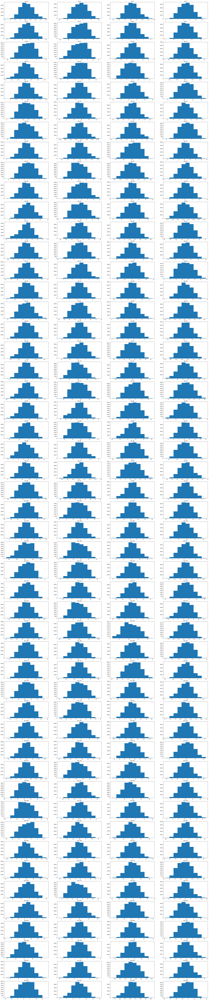

In [21]:
#hisograms are used to check distribution of data 
#draw histograms of numeric data in training set 
print("Distribution of Columns")
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    plt.hist(train[col])
    plt.title(col)    

#### Almost all features follow normalised distribution.

Distribution of columns per target class


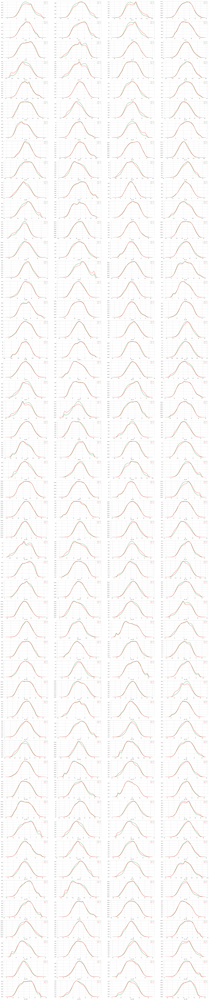

In [160]:
print("Distribution of columns per target class")
sns.set_style('whitegrid')
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    sns.distplot(train[train['target']==0][col],hist=False,label='0',color='green')
    sns.distplot(train[train['target']==1][col],hist=False,label='1',color='red')
  

Distribution of columns for test and train datset


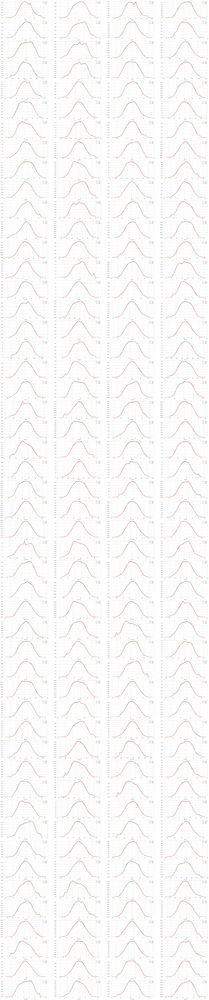

In [22]:
#Distribution of numeri variables in train and test data 
print("Distribution of columns for test and train datset")
sns.set_style('whitegrid')
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    sns.distplot(train[col],hist=False,label='train',color='green')
    sns.distplot(test[col],hist=False,label='test',color='red')

##### The train and test seems to be well balanced with respect with distribution of the numeric variables.

### Distribution of mean,median,standard deviation,kurtosis frequency, skewness frequency, min, max of train dataset for both targets (0 and 1) 

In [23]:
numerical_features_with_values=train.columns.values[2:202]

In [24]:
train_mean_rowwise_1=list(train[train['target']==1][numerical_features_with_values].mean(axis=1))
train_mean_rowwise_0=list(train[train['target']==0][numerical_features_with_values].mean(axis=1))

train_median_rowwise_1=list(train[train['target']==1][numerical_features_with_values].median(axis=1))
train_median_rowwise_0=list(train[train['target']==0][numerical_features_with_values].median(axis=1))

train_std_rowwise_1=list(train[train['target']==1][numerical_features_with_values].std(axis=1))
train_std_rowwise_0=list(train[train['target']==0][numerical_features_with_values].std(axis=1))

train_kurt_rowwise_1=list(train[train['target']==1][numerical_features_with_values].kurt(axis=1))
train_kurt_rowwise_0=list(train[train['target']==0][numerical_features_with_values].kurt(axis=1))

train_skew_rowwise_1=list(train[train['target']==1][numerical_features_with_values].skew(axis=1))
train_skew_rowwise_0=list(train[train['target']==0][numerical_features_with_values].skew(axis=1))

train_min_rowwise_1=list(train[train['target']==1][numerical_features_with_values].min(axis=1))
train_min_rowwise_0=list(train[train['target']==0][numerical_features_with_values].min(axis=1))

train_max_rowwise_1=list(train[train['target']==1][numerical_features_with_values].max(axis=1))
train_max_rowwise_0=list(train[train['target']==0][numerical_features_with_values].max(axis=1))

In [25]:
def plot_stats_train(x1,x2,aim,wise):
    colors = ['#4E00E6', '#31CF06']
    names = ['target 0','target 1']
    plt.figure(figsize=(25,8))
    plt.hist([x1,x2], bins =120, density=True,
         color = colors, label=names)
    sns.kdeplot(x1,color=colors[0])
    sns.kdeplot(x2,color=colors[1])
    # Plot formatting
    plt.legend()
    plt.xlabel(aim+' values')
    plt.ylabel('Normalized Density')
    plt.title('Distribution of '+aim+' per '+wise+' in train data')

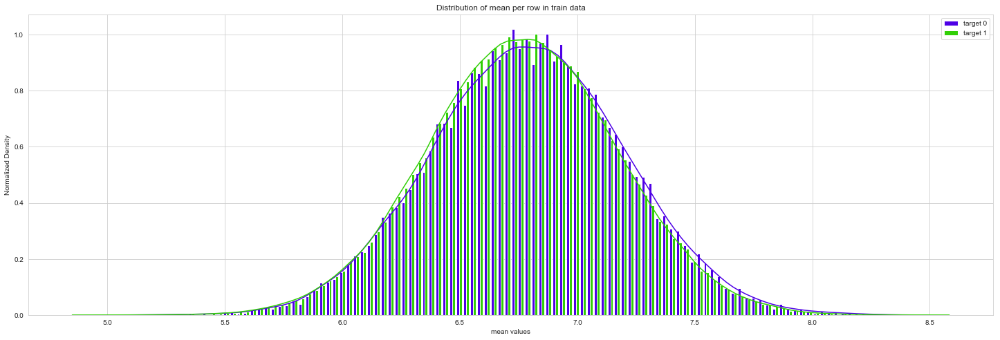

In [26]:
plot_stats_train(train_mean_rowwise_1,train_mean_rowwise_0,'mean',"row")

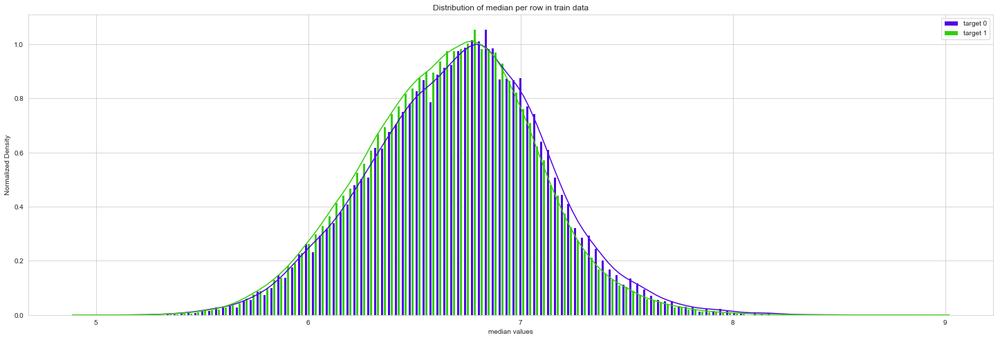

In [27]:
plot_stats_train(train_median_rowwise_1,train_median_rowwise_0,'median',"row")

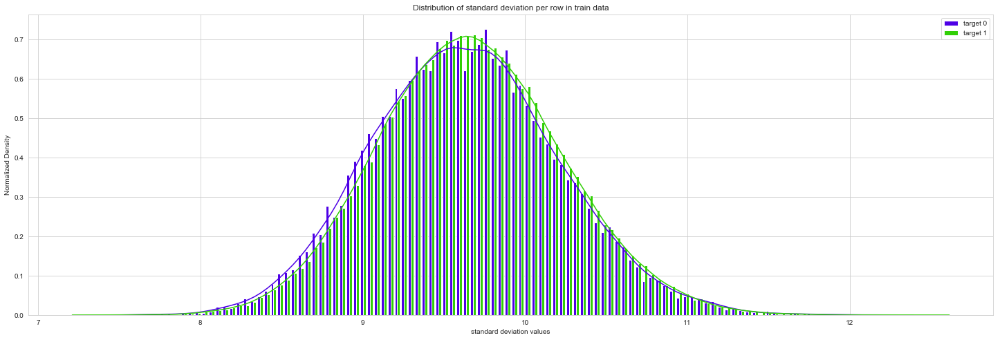

In [28]:
plot_stats_train(train_std_rowwise_1,train_std_rowwise_0,'standard deviation',"row")

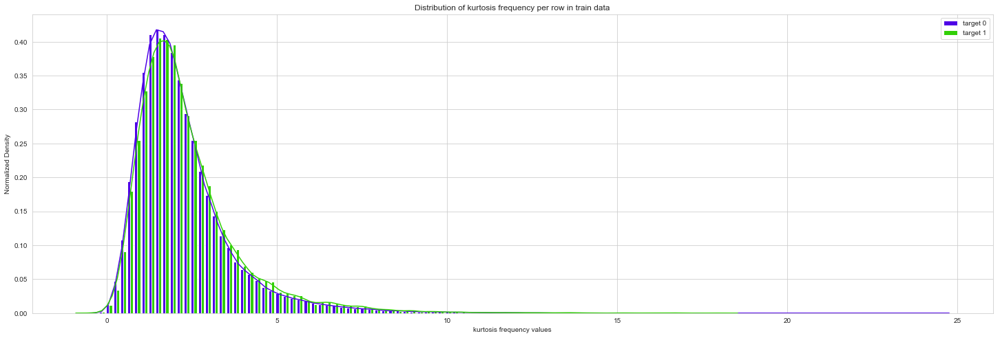

In [29]:
plot_stats_train(train_kurt_rowwise_0,train_kurt_rowwise_1,'kurtosis frequency', 'row')

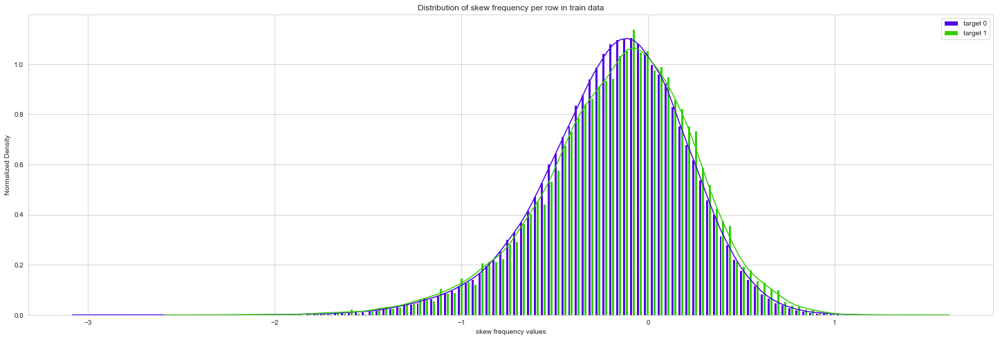

In [30]:
plot_stats_train(train_skew_rowwise_0,train_skew_rowwise_1,'skew frequency', 'row')

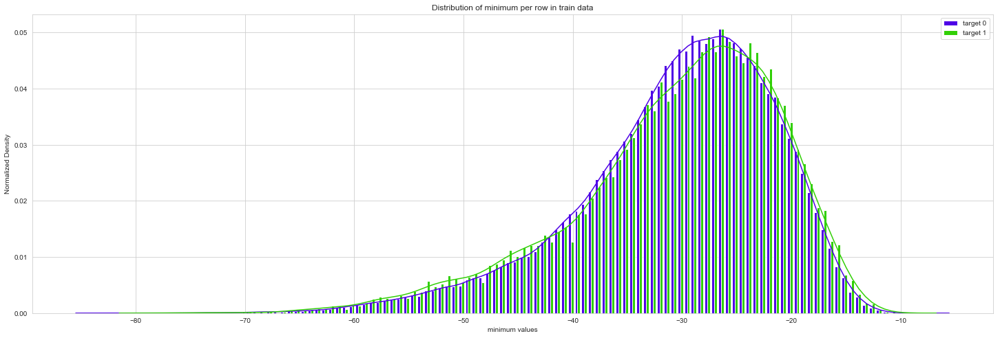

In [31]:
plot_stats_train(train_min_rowwise_0,train_min_rowwise_1,'minimum', 'row')

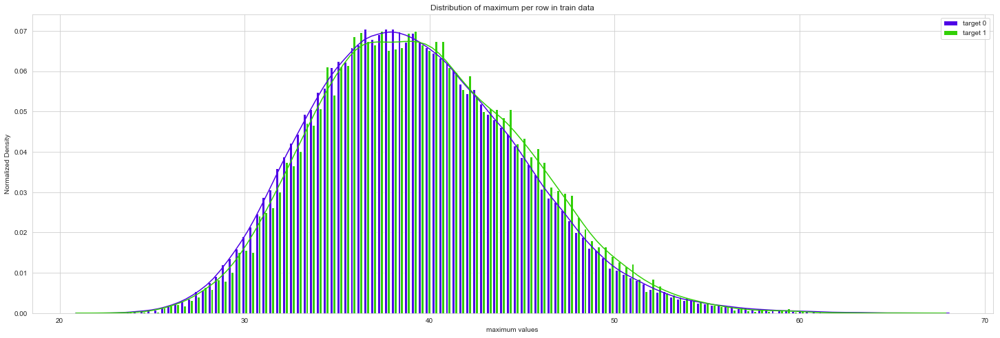

In [32]:
plot_stats_train(train_max_rowwise_0,train_max_rowwise_1,'maximum', 'row')

#### Distribution of mean,median,standard deviation,kurtosis frequency, skewness frequency, min, max of test and train datasets both rowwise 

In [33]:
train_mean_rowwise=list(train[numerical_features_with_values].mean(axis=1))
test_mean_rowwise=list(test[numerical_features_with_values].mean(axis=1))

train_median_rowwise=list(train[numerical_features_with_values].median(axis=1))
test_median_rowwise=list(test[numerical_features_with_values].median(axis=1))

train_std_rowwise=list(train[numerical_features_with_values].std(axis=1))
test_std_rowwise=list(test[numerical_features_with_values].std(axis=1))

train_kurt_rowwise=list(train[numerical_features_with_values].kurt(axis=1))
test_kurt_rowwise=list(test[numerical_features_with_values].kurt(axis=1))

train_skew_rowwise=list(train[numerical_features_with_values].skew(axis=1))
test_skew_rowwise=list(test[numerical_features_with_values].skew(axis=1))

train_min_rowwise=list(train[numerical_features_with_values].min(axis=1))
test_min_rowwise=list(test[numerical_features_with_values].min(axis=1))

train_max_rowwise=list(train[numerical_features_with_values].max(axis=1))
test_max_rowwise=list(test[numerical_features_with_values].max(axis=1))

In [34]:
def plot_stats(x1,x2,aim,wise):
    colors = [ '#FA7201', '#0E7B00']
    names = ['train','test']
    plt.figure(figsize=(25,8))
    plt.hist([x1,x2], bins =120, density=True,
         color = colors, label=names)
    sns.kdeplot(x1,color=colors[0])
    sns.kdeplot(x2,color=colors[1])
    # Plot formatting
    plt.legend()
    plt.xlabel(aim+' values')
    plt.ylabel('Normalized Density')
    plt.title('Distribution of '+aim+' per '+wise+' in test and train data')

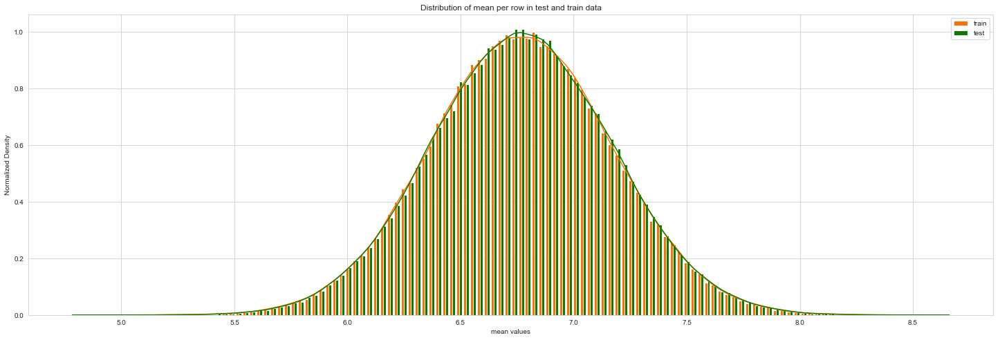

In [35]:
plot_stats(train_mean_rowwise,test_mean_rowwise,'mean','row')

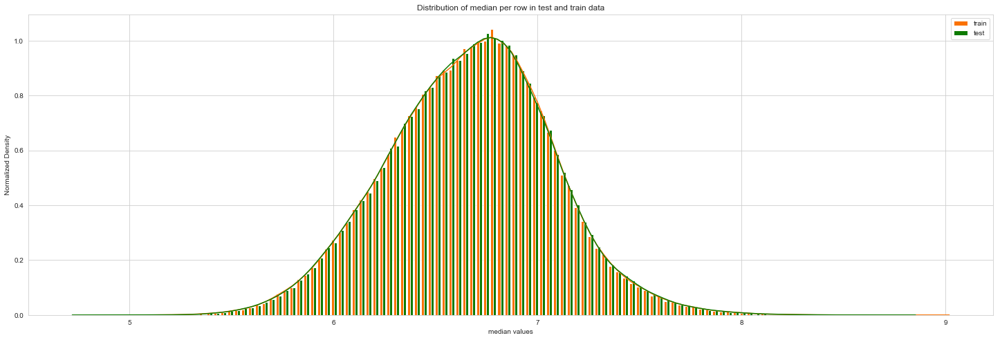

In [36]:
plot_stats(train_median_rowwise,test_median_rowwise,'median','row')

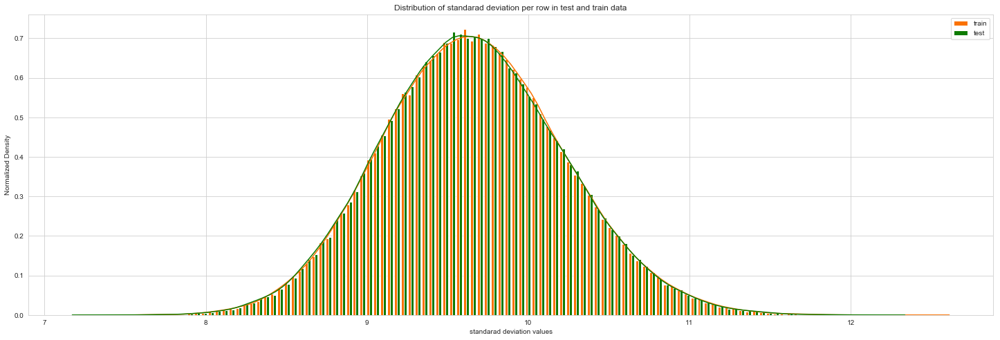

In [37]:
plot_stats(train_std_rowwise,test_std_rowwise,'standarad deviation','row')

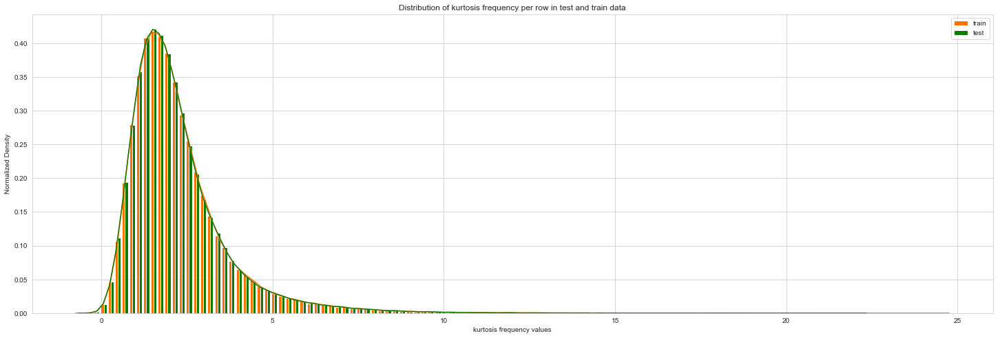

In [38]:
plot_stats(train_kurt_rowwise,test_kurt_rowwise,'kurtosis frequency','row')

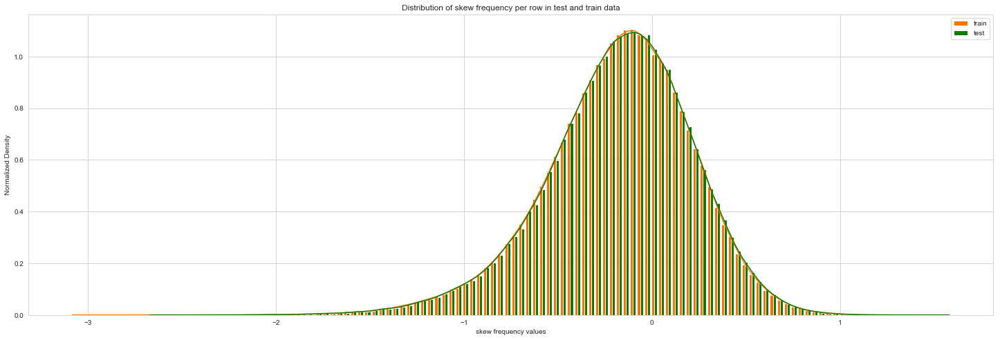

In [39]:
plot_stats(train_skew_rowwise,test_skew_rowwise,'skew frequency','row')

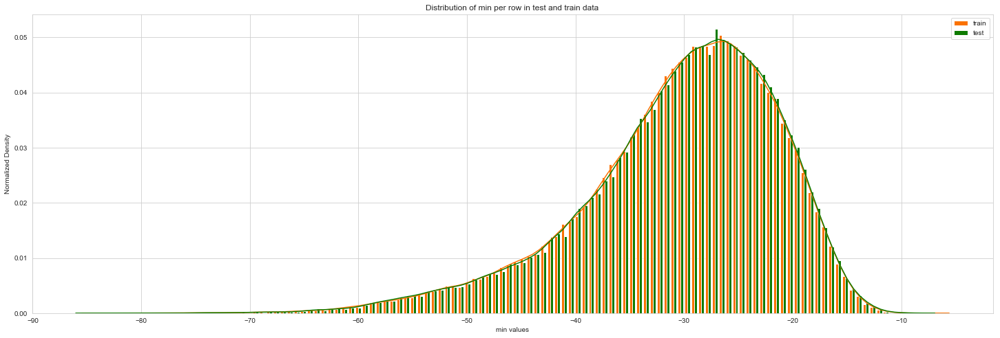

In [40]:
plot_stats(train_min_rowwise,test_min_rowwise,'min','row')

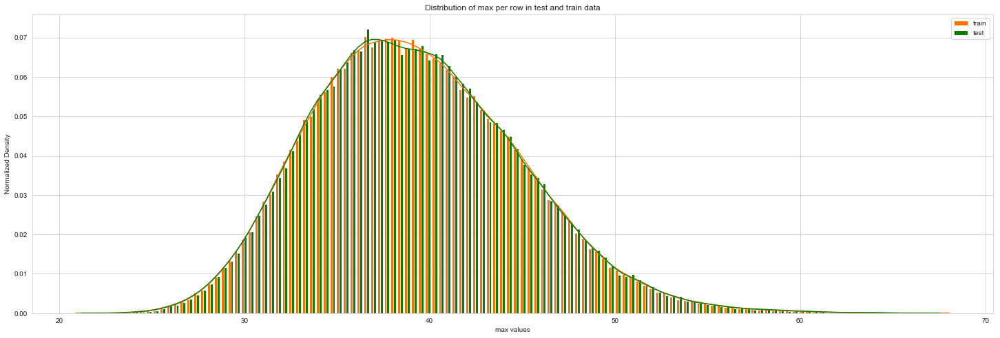

In [41]:
plot_stats(train_max_rowwise,test_max_rowwise,'max','row')

#### We can make few observations here:

#### Standard deviation is relatively large for both train and test variable data.
#### min, max, mean, median, sdt values for train and test data looks quite close.
#### Mean values are distributed over a large range.
#### Moreover mean and median have simmilar distribution.
#### Both train and test are Leptokurtic and negatively skewed.

#### Corelation between variables

In [42]:
# Compute the correlation matrix
corr = train[numerical_features].corr()
np.fill_diagonal(corr.values,np.nan)
corr.max().max(),corr.min().min()

(0.009676303707076816, -0.009839944915002988)

#####  We have 200 features that are mostly uncorrelated between them.
##### 200 numerical features that their histograms have a shape like the one of a normal distribution.

In [43]:
# At this point of time we should check for among 200 features which variables are useful for us.
# As the features are anonymous. This can be done by using PCA
# scale the data before using PCA
mmscale = MinMaxScaler()  
X_train = mmscale.fit_transform(train.drop(['target','ID_code'],axis=1))  
X_test = mmscale.transform(test.drop(['ID_code'],axis=1)) 

In [44]:
pca = PCA()  
a = pca.fit_transform(X_train) 
b = pca.transform(X_test)

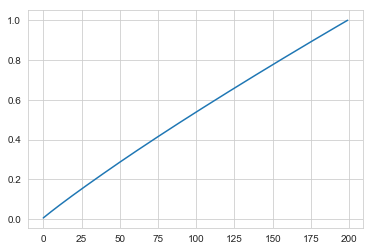

In [45]:
explained_variance = pca.explained_variance_ratio_
plt.plot(np.arange(200), np.cumsum(explained_variance))

##### the line of cumulative sums of explained variance ratio when you PCA the data set, it is indicative of a dataset that has already undergone PCA (get straight line ie y=x).
##### We have to go with all 200 variables.

In [4]:
T=200000
P=20098
scale_pos_weight = T/P - 1

scale_pos_weight
params = {}
params['learning_rate'] = 0.1
params['boosting_type'] = 'gbdt'
params['objective'] = 'binary'
params['metric'] = 'auc'
params['sub_feature'] = 1
params['num_leaves'] = 31
params['min_data'] = 20
params['max_depth'] = -1
params['scale_pos_weight']=scale_pos_weight

In [5]:
y = train['target']
x = train.drop(['target', "ID_code"], axis=1)

In [9]:
X_train, X_test, Y_train, Y_test =train_test_split(x, y, stratify = y, random_state=42, test_size=0.3)

In [10]:
trn_data = lgb.Dataset(X_train, label=Y_train)
val_data = lgb.Dataset(X_test, label=Y_test)

In [11]:
#using light gbm before feature engineeering 
num_round = 2000
clf1 = lgb.train(params, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=50, early_stopping_rounds = 100)

Training until validation scores don't improve for 100 rounds.
[50]	training's auc: 0.901459	valid_1's auc: 0.84368
[100]	training's auc: 0.936095	valid_1's auc: 0.867241
[150]	training's auc: 0.953428	valid_1's auc: 0.876875
[200]	training's auc: 0.964899	valid_1's auc: 0.881593
[250]	training's auc: 0.972979	valid_1's auc: 0.883849
[300]	training's auc: 0.97898	valid_1's auc: 0.885313
[350]	training's auc: 0.983854	valid_1's auc: 0.885492
[400]	training's auc: 0.987774	valid_1's auc: 0.885562
[450]	training's auc: 0.990805	valid_1's auc: 0.885353
Early stopping, best iteration is:
[380]	training's auc: 0.986307	valid_1's auc: 0.885757


In [12]:
Y_pred= clf1.predict(X_test, num_iteration=clf1.best_iteration)
print("CV score before adding features for standard parameters: {:<.5f}".format(roc_auc_score(Y_test, Y_pred)))

CV score before adding features for standard parameters: 0.88576


In [100]:
test.drop(['ID_code'], axis=1, inplace=True)

In [101]:
df_test = test.values

unique_samples = []
unique_count = np.zeros_like(df_test)
for feature in range(df_test.shape[1]):
    _, index_, count_ = np.unique(df_test[:, feature], return_counts=True, return_index=True)
    unique_count[index_[count_ == 1], feature] += 1

# Samples which have unique values are real the others are fake
real_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) > 0)[:, 0]
synthetic_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) == 0)[:, 0]

print('Found',len(real_samples_indexes),'real test')
print('Found',len(synthetic_samples_indexes),'fake test')

Found 100000 real test
Found 100000 fake test


In [102]:
#adding features
# FREQUENCY ENCODE
def encode_FE(df,col,test):
    cv = df[col].value_counts()
    nm = "freq_"+col
    df[nm] = df[col].map(cv)
    test[nm] = test[col].map(cv)
    test[nm].fillna(0,inplace=True)
    if cv.max()<=255:
        df[nm] = df[nm].astype('uint8')
        test[nm] = test[nm].astype('uint8')
    else:
        df[nm] = df[nm].astype('uint16')
        test[nm] = test[nm].astype('uint16')        
    return

test['target'] = -1
comb = pd.concat([train,test.loc[real_samples_indexes]],axis=0,sort=True)
for i in range(200): encode_FE(comb,'var_'+str(i),test)
train = comb[:len(train)]; del comb
print('Added 200 new magic features!')

Added 200 new magic features!


In [106]:
train.drop(['ID_code'], axis=1, inplace=True)

In [15]:
#adding features
for df in [train,test]:
    df['sum'] = df[numerical_features].sum(axis=1)  
    df['min'] = df[numerical_features].min(axis=1)
    df['max'] = df[numerical_features].max(axis=1)
    df['mean'] = df[numerical_features].mean(axis=1)
    df['std'] = df[numerical_features].std(axis=1)
    df['skew'] = df[numerical_features].skew(axis=1)
    df['kurt'] = df[numerical_features].kurtosis(axis=1)
    df['med'] = df[numerical_features].median(axis=1)

In [108]:
y_ = train['target']
x_ = train.drop(['target'], axis=1)

In [109]:
X1_train, X1_test, Y1_train, Y1_test =train_test_split(x_, y_, stratify = y_, random_state=42, test_size=0.3)

In [110]:
trn_data = lgb.Dataset(X1_train, label=Y1_train)
val_data = lgb.Dataset(X1_test, label=Y1_test)

In [111]:
num_round =2000
clf2 = lgb.train(params, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=50, early_stopping_rounds = 100)

Training until validation scores don't improve for 100 rounds.
[50]	training's auc: 0.906231	valid_1's auc: 0.852356
[100]	training's auc: 0.940138	valid_1's auc: 0.876674
[150]	training's auc: 0.957716	valid_1's auc: 0.887153
[200]	training's auc: 0.968653	valid_1's auc: 0.892891
[250]	training's auc: 0.976297	valid_1's auc: 0.896126
[300]	training's auc: 0.982218	valid_1's auc: 0.898283
[350]	training's auc: 0.986667	valid_1's auc: 0.899216
[400]	training's auc: 0.990222	valid_1's auc: 0.899523
[450]	training's auc: 0.992857	valid_1's auc: 0.89958
[500]	training's auc: 0.994829	valid_1's auc: 0.899407
[550]	training's auc: 0.996322	valid_1's auc: 0.899123
Early stopping, best iteration is:
[458]	training's auc: 0.993194	valid_1's auc: 0.899686


In [112]:
Y_pred2= clf2.predict(X1_test, num_iteration=clf2.best_iteration)
print("CV score after adding features for standard parameters: {:<.5f}".format(roc_auc_score(Y1_test, Y_pred2)))

CV score after adding features for standard parameters: 0.89969


In [135]:
params = {
    'bagging_freq': 5,
    'bagging_fraction': 0.4,
    'boost_from_average':'false',
    'boost': 'gbdt',
    'feature_fraction': 1,
    'learning_rate': 0.01,
    'max_depth': -1,  
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 8,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': 1,
    "scale_pos_weight":scale_pos_weight
}

In [134]:
features = [c for c in train.columns if c not in ['target']]
target = train['target']

In [137]:
df_train=train
df_test=test.iloc[real_samples_indexes,:]

In [138]:
#using stratified kfold technique with tuned parameters
folds = StratifiedKFold(n_splits=10, shuffle=False, random_state=44000)
oof = np.zeros(len(df_train))
predictions = np.zeros(len(df_test))
feature_importance_df = pd.DataFrame()

for fold_, (trn_idx, val_idx) in enumerate(folds.split(df_train.values, target.values)):
    print("Fold {}".format(fold_))
    trn_data = lgb.Dataset(df_train.iloc[trn_idx][features], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(df_train.iloc[val_idx][features], label=target.iloc[val_idx])

    num_round = 1000000
    clf = lgb.train(params, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=1000, early_stopping_rounds = 3000)
    oof[val_idx] = clf.predict(df_train.iloc[val_idx][features], num_iteration=clf.best_iteration)
    
    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = features
    fold_importance_df["importance"] = clf.feature_importance()
    fold_importance_df["fold"] = fold_ + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    
    predictions += clf.predict(df_test[features], num_iteration=clf.best_iteration) / folds.n_splits



Fold 0
Training until validation scores don't improve for 3000 rounds.
[1000]	training's auc: 0.877148	valid_1's auc: 0.856412
[2000]	training's auc: 0.90478	valid_1's auc: 0.879812
[3000]	training's auc: 0.917501	valid_1's auc: 0.890304
[4000]	training's auc: 0.925562	valid_1's auc: 0.896292
[5000]	training's auc: 0.931361	valid_1's auc: 0.900003
[6000]	training's auc: 0.936218	valid_1's auc: 0.902248
[7000]	training's auc: 0.940894	valid_1's auc: 0.903073
[8000]	training's auc: 0.945159	valid_1's auc: 0.903696
[9000]	training's auc: 0.949352	valid_1's auc: 0.904034
[10000]	training's auc: 0.953124	valid_1's auc: 0.904179
[11000]	training's auc: 0.956716	valid_1's auc: 0.904389
[12000]	training's auc: 0.960066	valid_1's auc: 0.904737
[13000]	training's auc: 0.963191	valid_1's auc: 0.905058
[14000]	training's auc: 0.966119	valid_1's auc: 0.904539
[15000]	training's auc: 0.968896	valid_1's auc: 0.904604
[16000]	training's auc: 0.971475	valid_1's auc: 0.904414
Early stopping, best iterat

In [141]:
print("CV score: {:<8.5f}".format(roc_auc_score(target, oof)))

CV score: 0.90606 


In [146]:
auc=roc_auc_score(target, oof)

In [148]:
from sklearn.metrics import roc_curve
fpr,tpr,thresholds=roc_curve(target,oof)

In [150]:
a=pd.DataFrame()
a['fpr']=fpr
a['tpr']=tpr
a['thresholds']=thresholds

In [151]:
mmscale = MinMaxScaler()  
a = mmscale.fit_transform(a)
a=pd.DataFrame(a)

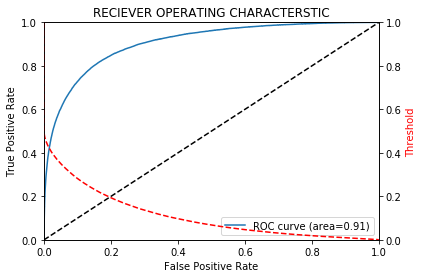

In [152]:
plt.figure()
plt.plot(a[0],a[1],label='ROC curve (area=%0.2f)'%auc)
plt.plot([0,1],[0,1],"k--")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("RECIEVER OPERATING CHARACTERSTIC")
plt.legend(loc="lower right")

ax2=plt.gca().twinx()
ax2.plot(a[0],a[2],markeredgecolor='red',linestyle="dashed",color="red")
ax2.set_ylabel('Threshold',color="red")
ax2.set_ylim([min(a[2]),max(a[2])])
ax2.set_xlim([min(a[0]),max(a[0])])
plt.savefig("roc_and_threshold.png")
plt.show()
plt.close()

In [153]:
lgb_pred2 = np.zeros(len(oof))

In [158]:
for i in range(0,len(oof)):
    if oof[i]>=.5:     
       lgb_pred2[i]=1
    else:  
       lgb_pred2[i]=0

In [159]:
lgb_acu=accuracy_score(lgb_pred2,target)
lgb_pre=precision_score(lgb_pred2, target)
lgb_rec=recall_score(lgb_pred2,target)
lgb_f1=f1_score(lgb_pred2, target)

print("Accuracy Score for LightGBM is ",lgb_acu)
print("Precision Score for  LightGBM is ",lgb_pre)
print("Recall Score for LightGBM is ",lgb_rec)
print("f1 Score for LightGBM is ",lgb_f1)

Accuracy Score for LightGBM is  0.86031
Precision Score for  LightGBM is  0.777291272763459
Recall Score for LightGBM is  0.39970320335687237
f1 Score for LightGBM is  0.527930789767159
